In [1]:
import dynamiqs as dq
import jax.numpy as jnp
import matplotlib.pyplot as plt

In [2]:
MHz = 1
us = 1

# Resonant cat generation

In [143]:
N = 100
g = 1 * MHz
alpha0 = 4
p_prep = 0
tmax = 2 * jnp.pi * alpha0 / g
tsave = jnp.linspace(0, tmax, 1001)

In [144]:
a, sigmap = dq.destroy(N, 2)
sigmam = sigmap.dag()
sigmaz = dq.tensor(dq.eye(N), dq.sigmaz())
H = g * (a.dag() @ sigmam + a @ sigmap)
ket0 = dq.tensor(
    dq.coherent(N, alpha0),
    dq.unit(jnp.sqrt(p_prep) * dq.basis(2, 0) + jnp.sqrt(1 - p_prep) * dq.basis(2, 1)),
)
output = dq.sesolve(H, ket0, tsave=tsave)

|██████████| 100.0% ◆ elapsed 8.02ms ◆ remaining 0.00ms


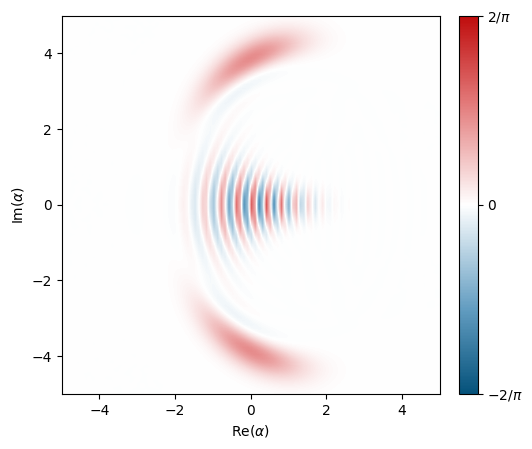

In [145]:
dq.plot.wigner(
    dq.ptrace(output.states[jnp.argmin(jnp.abs(jnp.pi * alpha0 / g - tsave))], 0)
)

100%|██████████| 50/50 [00:04<00:00, 10.41it/s]


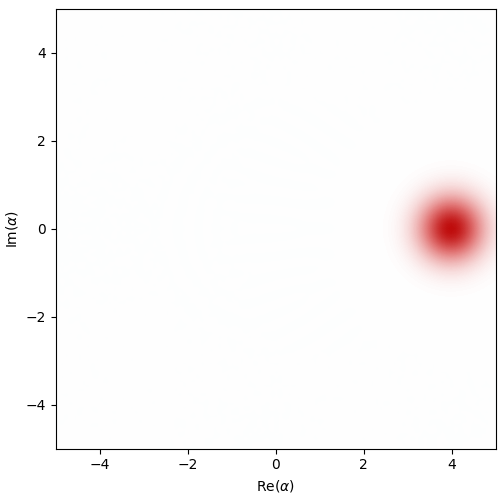

In [146]:
dq.plot.wigner_gif(dq.ptrace(output.states, 0))

/Users/remirousseau/Documents/Work/Thesis/quantum_simulations/venv/lib/python3.13/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/remirousseau/Documents/Work/Thesis/quantum_simulations/venv/lib/python3.13/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


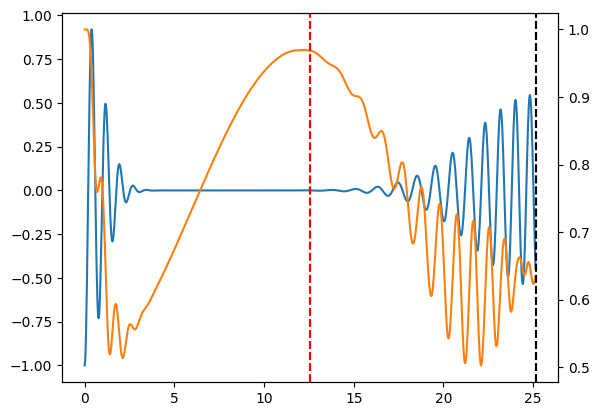

In [147]:
plt.plot(tsave, dq.expect(sigmaz, output.states))
plt.axvline(2 * jnp.pi * alpha0 / g, c="k", ls="--")
plt.axvline(jnp.pi * alpha0 / g, c="r", ls="--")
secax = plt.gca().twinx()
secax.plot(
    tsave, dq.trace(dq.ptrace(output.states, 1) @ dq.ptrace(output.states, 1)), "C1"
)
plt.axvline(2 * jnp.pi * alpha0 / g, c="k", ls="--")
plt.axvline(jnp.pi * alpha0 / g, c="r", ls="--")

# Dispersive cat generation

In [220]:
N = 100
g = 1 * MHz
alpha0 = 2
p_prep = 0.5
tmax = 2 * jnp.pi / g
tsave = jnp.linspace(0, tmax, 1001)

In [221]:
a, sigmap = dq.destroy(N, 2)
sigmam = sigmap.dag()
sigmaz = dq.tensor(dq.eye(N), dq.sigmaz())
sigmax = dq.tensor(dq.eye(N), dq.sigmax())
plus_x = dq.tensor(dq.eye(N), dq.unit(dq.basis(2, 1) + dq.basis(2, 0)))
minus_x = dq.tensor(dq.eye(N), dq.unit(dq.basis(2, 1) - dq.basis(2, 0)))
H = g * a.dag() @ a @ sigmaz / 2
ket0 = dq.tensor(
    dq.coherent(N, alpha0),
    dq.unit(jnp.sqrt(p_prep) * dq.basis(2, 0) - jnp.sqrt(1 - p_prep) * dq.basis(2, 1)),
)
output = dq.sesolve(H, ket0, tsave=tsave)

|██████████| 100.0% ◆ elapsed 4.19ms ◆ remaining 0.00ms


100%|██████████| 50/50 [00:04<00:00, 10.33it/s]


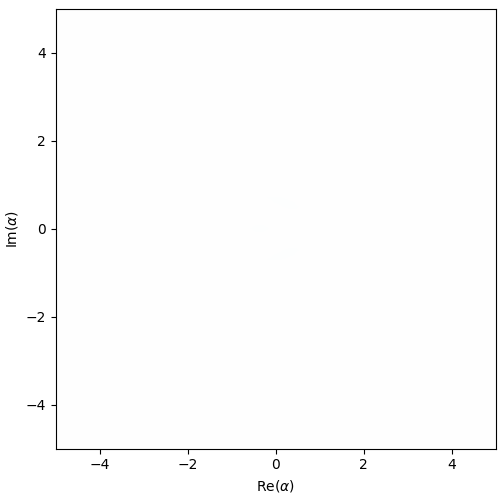

In [222]:
dq.plot.wigner_gif(dq.ptrace(plus_x @ plus_x.dag() @ output.states, 0))

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:04<00:00, 11.05it/s]


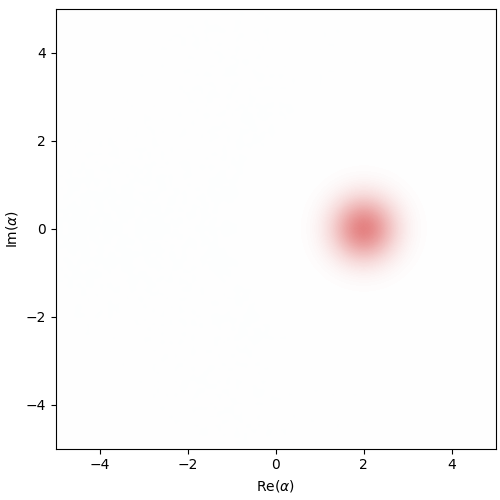

In [218]:
dq.plot.wigner_gif(dq.ptrace(minus_x @ minus_x.dag() @ output.states, 0))

/Users/remirousseau/Documents/Work/Thesis/quantum_simulations/venv/lib/python3.13/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/remirousseau/Documents/Work/Thesis/quantum_simulations/venv/lib/python3.13/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


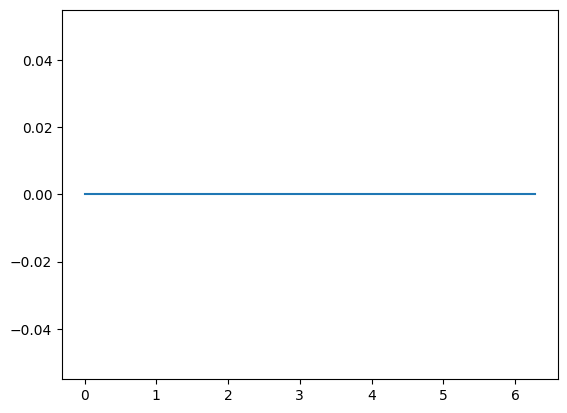

In [219]:
plt.plot(tsave, dq.expect(sigmax, output.states))

# Detuned cat

In [19]:
Na, Nb = 20, 5
alpha_2 = 4
delta = 0.5 * MHz

g2 = 1 * MHz
kappa_b = 20 * MHz
eps_d = -alpha_2 / g2
kappa_2 = 4 * g2**2 / kappa_b

a, b = dq.destroy(Na, Nb)
H = g2 * a @ a @ b.dag() + eps_d * b
H += H.dag()
H += delta * b.dag() @ b + delta / 2 * a.dag() @ a

tmax = 5 / kappa_2
times = jnp.linspace(0, tmax, 501)
output = dq.mesolve(H, [jnp.sqrt(kappa_b) * b], dq.coherent((Na, Nb), (0, 0)), times)

|██████████| 100.0% ◆ elapsed 791.62ms ◆ remaining 0.00ms  


100%|██████████| 50/50 [00:01<00:00, 37.25it/s]


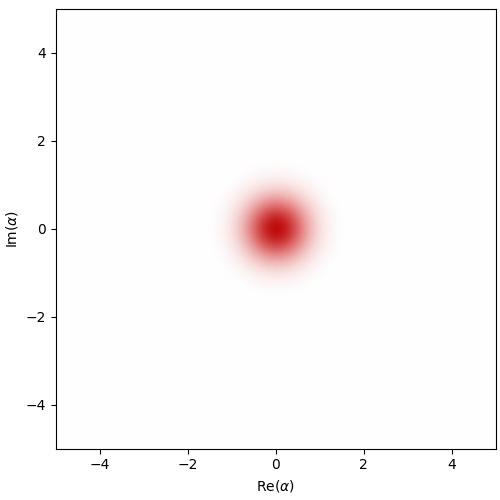

In [20]:
dq.plot.wigner_gif(dq.ptrace(output.states, 0))

# Quick test multimode

In [47]:
Na, Nb = 10, 5
alpha_2 = 4

a1, a2, b = dq.destroy(Na, Na, Nb)
delta_a, delta_b = 0.05 * MHz, 0.05 * MHz
g21, g22 = 1 * MHz, 1 * MHz
kappa_b = 20 * MHz
eps_d = -alpha_2 / g21

kappa_2 = 4 * g21**2 / kappa_b

In [48]:
H = (
    g21 * a1 @ a1 @ b.dag()
    + g22 * a2 @ a2 @ b.dag()
    + eps_d * b
    + delta_a1 * a1.dag() @ a1
    + delta_a2 * a2.dag() @ a2
)
H += H.dag()
tmax = 5 / kappa_2
times = jnp.linspace(0, tmax, 501)
output = dq.mesolve(
    H, [jnp.sqrt(kappa_b) * b], dq.coherent((Na, Na, Nb), (0, 0, 0)), times
)

|██████████| 100.0% ◆ elapsed 22.81s ◆ remaining 0.00ms  


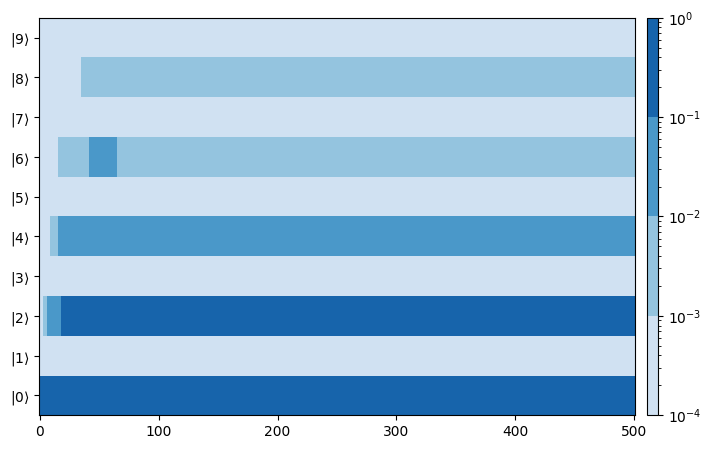

In [49]:
dq.plot.fock_evolution(dq.ptrace(output.states, 0), logscale=True)

100%|██████████| 50/50 [00:01<00:00, 33.65it/s]


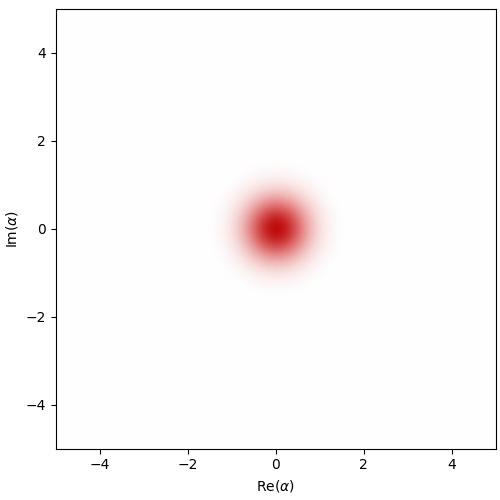

In [50]:
dq.plot.wigner_gif(dq.ptrace(output.states, 0))

100%|██████████| 50/50 [00:01<00:00, 31.80it/s]


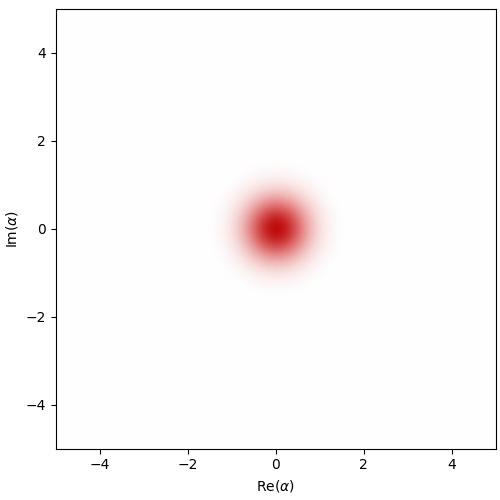

In [51]:
dq.plot.wigner_gif(dq.ptrace(output.states, 1))

In [42]:
eps_Z = 0.1 * MHz
H_d = (a1 + a1.dag()) * eps_Z
output2 = dq.mesolve(H + H_d, [jnp.sqrt(kappa_b) * b], output.states[-1], times)

|██████████| 100.0% ◆ elapsed 33.16s ◆ remaining 0.00ms  


100%|██████████| 50/50 [00:01<00:00, 30.82it/s]


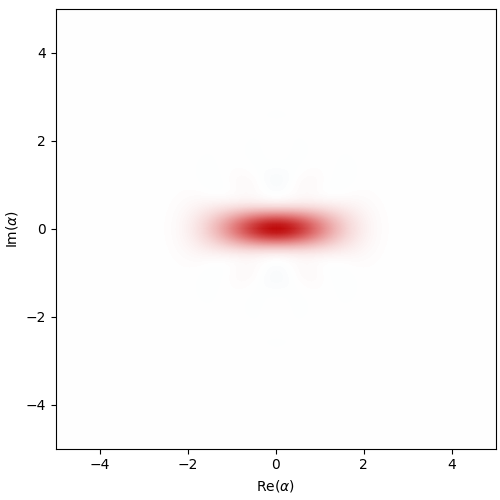

In [43]:
dq.plot.wigner_gif(dq.ptrace(output2.states, 0))

100%|██████████| 50/50 [00:01<00:00, 32.65it/s]


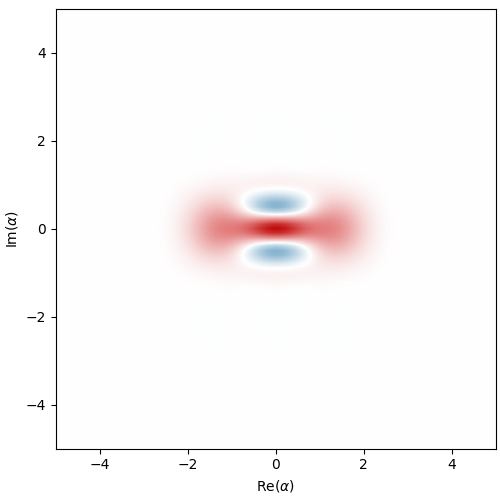

In [44]:
dq.plot.wigner_gif(dq.ptrace(output2.states, 1))

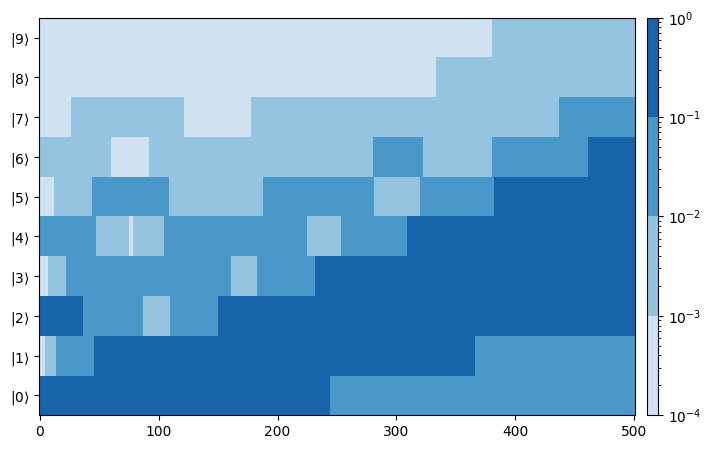

In [46]:
dq.plot.fock_evolution(dq.ptrace(output2.states, 0), logscale=True)

# Testing GBS

In [40]:
import dynamiqs as dq
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

In [42]:
N = 40
r1, r2 = 1, -1
thetas = jnp.linspace(0, jnp.pi, 101)
n_proj = 10

void = dq.coherent(N, 0)
st1, st2 = dq.squeeze(N, r1) @ void, dq.squeeze(N, r2) @ void
tot = dq.tensor(st1, st2)

a1, a2 = dq.destroy(N, N)
aloc = dq.destroy(N)
H_bs = a1.dag() @ a2 - a1 @ a2.dag()
nbars = []
for theta in tqdm(thetas):
    U_bs = dq.expm(theta * H_bs)
    tot = U_bs @ tot
    n_op = dq.tensor(dq.eye(N), dq.fock(N, n_proj))
    post_selected = dq.ptrace(dq.unit(n_op @ n_op.dag() @ tot), 0)
    nbars.append(dq.expect(aloc.dag() @ aloc, post_selected).real)

# dq.plot.wigner(dq.ptrace(post_selected, 0))

  0%|          | 0/101 [00:00<?, ?it/s]/Users/remirousseau/Documents/Work/Thesis/quantum_simulations/venv/lib/python3.13/site-packages/equinox/_module.py:1096: UserWarning: A `SparseDIAQArray` has been converted to a `DenseQArray` while computing its matrix exponential.
  return self.__func__(self.__self__, *args, **kwargs)
100%|██████████| 101/101 [01:16<00:00,  1.33it/s]


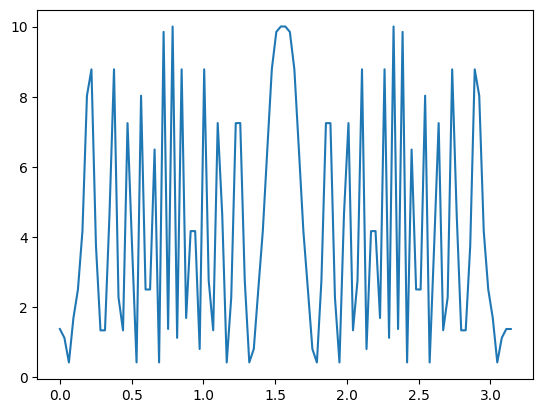

In [43]:
plt.plot(thetas, nbars)

# Decoherence to thermal state

In [19]:
N = 100
kappa_1 = 1
nth = 100
t_max = 0.1 * kappa_1
alpha0 = 5

a = dq.destroy(N)
Ld = jnp.sqrt(kappa_1 * (1 + nth)) * a
Lu = jnp.sqrt(kappa_1 * nth) * a.dag()
H = 0 * a
rho_0 = dq.coherent(N, alpha0)
times = jnp.linspace(0, t_max, 501)
output = dq.mesolve(H, [Ld, Lu], rho_0, times)

|██████████| 100.0% ◆ elapsed 1.20s ◆ remaining 0.00ms     


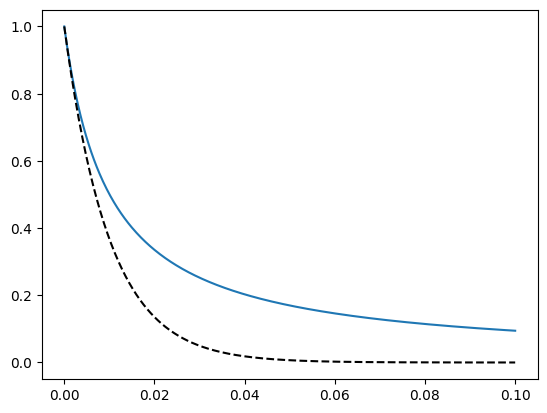

In [20]:
plt.plot(times, dq.fidelity(output.states, rho_0))
plt.plot(times, jnp.exp(-nth * kappa_1 * times), "k--")

# Cat generation Kerr

In [20]:
N = 50

a = dq.destroy(N)
H = a.dag() @ a.dag() @ a @ a

rho_0 = dq.coherent(N, 4)
times = jnp.linspace(0, jnp.pi / 6, 501)
output = dq.sesolve(H, rho_0, times)

|██████████| 100.0% ◆ elapsed 19.01ms ◆ remaining 0.00ms


100%|██████████| 50/50 [00:02<00:00, 22.07it/s]


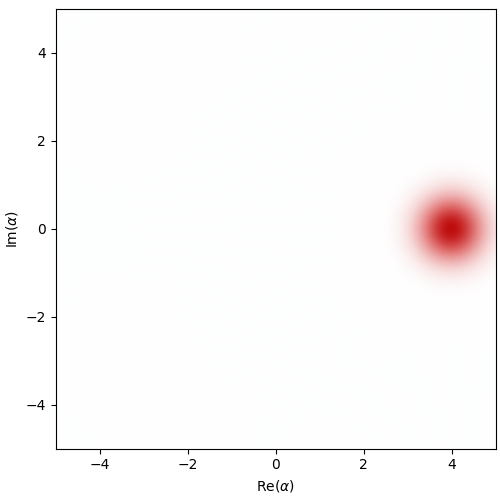

In [21]:
dq.plot.wigner_gif(output.states)

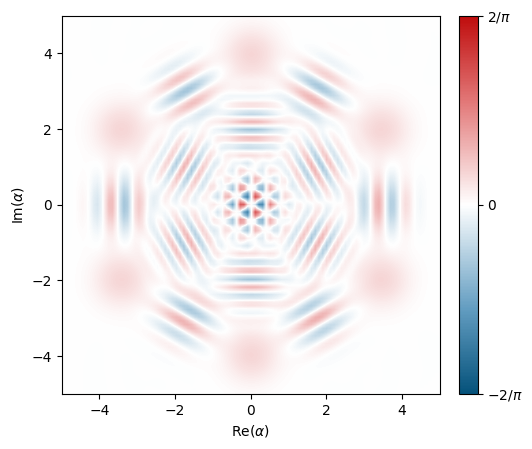

In [22]:
dq.plot.wigner(output.states[-1])

# Terms expansion

In [ ]:
import sympy as sp
from sympy.physics.quantum import Dagger
from sympy.physics.quantum.boson import BosonOp
from sympy.physics.quantum.operatorordering import normal_ordered_form

a = BosonOp("a")
adag = Dagger(a)
b = BosonOp("b")
bdag = Dagger(b)

phi_a, phi_b = sp.symbols("varphi_a varphi_b")
wa, wb = sp.symbols("omega_a omega_b")
t = sp.symbols("t")


phi = phi_a * (a * sp.exp(-sp.I * wa * t) + adag * sp.exp(sp.I * wa * t)) + phi_b * (
    b * sp.exp(-sp.I * wb * t) + bdag * sp.exp(sp.I * wb * t)
)
expr = (phi**3).expand()

nexpr = normal_ordered_form(expr, independent=True)
nexpr

varphi_a**3*exp(3*I*omega_a*t)*Dagger(a)**3 + 3*varphi_a**3*exp(I*omega_a*t)*Dagger(a) + 3*varphi_a**3*exp(I*omega_a*t)*Dagger(a)**2*a + 3*varphi_a**3*exp(-I*omega_a*t)*Dagger(a)*a**2 + 3*varphi_a**3*exp(-I*omega_a*t)*a + varphi_a**3*exp(-3*I*omega_a*t)*a**3 + 3*varphi_a**2*varphi_b*exp(2*I*omega_a*t)*exp(I*omega_b*t)*Dagger(a)**2*Dagger(b) + 3*varphi_a**2*varphi_b*exp(2*I*omega_a*t)*exp(-I*omega_b*t)*Dagger(a)**2*b + 6*varphi_a**2*varphi_b*exp(I*omega_b*t)*Dagger(a)*Dagger(b)*a + 3*varphi_a**2*varphi_b*exp(I*omega_b*t)*Dagger(b) + 6*varphi_a**2*varphi_b*exp(-I*omega_b*t)*Dagger(a)*a*b + 3*varphi_a**2*varphi_b*exp(-I*omega_b*t)*b + 3*varphi_a**2*varphi_b*exp(-2*I*omega_a*t)*exp(I*omega_b*t)*Dagger(b)*a**2 + 3*varphi_a**2*varphi_b*exp(-2*I*omega_a*t)*exp(-I*omega_b*t)*a**2*b + 3*varphi_a*varphi_b**2*exp(I*omega_a*t)*exp(2*I*omega_b*t)*Dagger(a)*Dagger(b)**2 + 3*varphi_a*varphi_b**2*exp(I*omega_a*t)*Dagger(a) + 6*varphi_a*varphi_b**2*exp(I*omega_a*t)*Dagger(a)*Dagger(b)*b + 3*varphi_a*va

# Lyapunov function simplification

In [ ]:
import sympy as sp
from sympy.physics.quantum import Dagger
from sympy.physics.quantum.boson import BosonOp
from sympy.physics.quantum.operatorordering import normal_ordered_form

a = BosonOp("a")
ad = Dagger(a)
alpha = sp.Symbol("alpha", real=True)
lam = sp.Symbol("lambda", complex=True)

L = a * a - alpha**2 + lam * ad * a
Ld = Dagger(L)

expr = (L * Ld - Ld * L).expand()
nexpr = normal_ordered_form(expr)
nexpr

2*lambda*Dagger(a)**2 + 2*conjugate(lambda)*a**2 + 2 + 4*Dagger(a)*a

# sigma amplitude computation

In [ ]:
2 * 1.3e6 / (18.1e9 * (0.1**2) * 0.23)

0.0624549603651213